In [1]:
# Load libraries
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

/home/wfn7ad/.local/lib/python3.8/site-packages/pandas/core/computation/expressions.py:20: UserWarning: Pandas requires version '2.7.3' or newer of 'numexpr' (version '2.7.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


In [2]:
final_data = pd.read_csv("../../data/mergent_and_library/final_data_v2.csv")
final_data

,Unnamed: 0,duns,company_name,firstname,lastname,title,gender,flag_owner,flag_presi_vicepresi,prob_nw_eth_wiki,...,primary_naics,naics2,naics_name,flag_executive_reported,geoid,prop_nwh,geometry,prob_spacy,prob_gt,prob_ld
0,0,00-138-3244,"WILSON, LYNNFORD SAMUEL JR",Lynnford,Wilson,Owner,U,1,0,0.917946,...,621111,62,Health Care and Social Assistance,1,5.105948e+10,26.602177,"c(-77.324596, 38.999535)",0.999995,0.0,1
1,1,00-145-3948,CROCODILE CONSULTING,Jessica,Moore,Administrative Assistant Sales,FEMALE,0,0,NaN,...,541611,54,"Professional, Scientific, and Technical Services",1,5.105948e+10,20.372268,"c(-77.389534, 38.994397)",0.000000,0.0,0
2,2,00-145-3948,CROCODILE CONSULTING,Leonard,Caldwell,Owner,MALE,1,0,NaN,...,541611,54,"Professional, Scientific, and Technical Services",1,5.105948e+10,20.372268,"c(-77.389534, 38.994397)",0.000000,0.0,0
3,3,00-171-0412,CENTREVILLE TAX SERVICE LLC,Scott,Walls,Owner,MALE,1,0,0.087375,...,541213,54,"Professional, Scientific, and Technical Services",1,5.105949e+10,19.153605,"c(-77.460635, 38.8639)",0.999994,0.0,1
4,4,00-183-0152,KAUFMAN ASSOC,Betsy,Kaufman,Owner,FEMALE,1,0,0.957856,...,541618,54,"Professional, Scientific, and Technical Services",1,5.105942e+10,36.208236,"c(-77.08656, 38.777228)",0.999673,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18151,18151,96-994-4219,"GEOPAY, INC.",Karla,Russell,Chief Operating Officer,FEMALE,0,0,0.747244,...,812990,81,Other Services (except Public Administration),1,5.105948e+10,34.302699,"c(-77.331479, 38.948677)",0.000000,0.0,0
18152,18152,96-995-4812,K EDWARD ROBINSON & ASSOCIATES LLC,Keith,Robinson,Pres-ceo,MALE,0,0,NaN,...,541611,54,"Professional, Scientific, and Technical Services",1,5.105942e+10,62.402930,"c(-77.230478, 38.707725)",0.999673,0.0,1
18153,18153,96-996-0488,"LAGNIAPPE CONSULTING, LLC",Wallace,Daniels,Owner,MALE,1,0,0.064103,...,541612,54,"Professional, Scientific, and Technical Services",1,5.105942e+10,60.324061,"c(-77.097715, 38.7433)",0.000000,0.0,0
18154,18154,96-996-0488,"LAGNIAPPE CONSULTING, LLC",Omar,Daniels,Co-owner,MALE,0,0,0.022954,...,541612,54,"Professional, Scientific, and Technical Services",1,5.105942e+10,60.324061,"c(-77.097715, 38.7433)",0.000000,0.0,0


In [3]:
# clean the flagged dataset to filter down to companies that were created before 1964
final_data = final_data[pd.notna(final_data['founding_year'])]
pre_1964 = final_data[final_data['founding_year'] <= 1964]
pre_1964 = pre_1964[pre_1964['founding_year']!= 0]
#pre_1964 = pre_1964[['duns', 'company_name0', 'founding_year']]

In [4]:
# cleaned final data 
final_data = final_data[final_data['prob_nw_eth_wiki']!= 1.0]
final_data = final_data[pd.notna(final_data['prob_nw_eth_wiki'])]

In [6]:
# number of companies flag in the listings
n = final_data['flag_mergent_plus_listing'].sum()
n

579

In [7]:
# filter out NaN values for wiki

subset_listed = final_data[final_data['flag_mergent_plus_listing']==1]
subset_nonlisted = final_data[final_data['flag_mergent_plus_listing']==0]
sample = subset_nonlisted.sample(n,replace=False)
data = pd.concat([subset_listed, sample])
#merged_data.columns

In [8]:
data.columns

Index(['Unnamed: 0', 'duns', 'company_name', 'firstname', 'lastname', 'title',
       'gender', 'flag_owner', 'flag_presi_vicepresi', 'prob_nw_eth_wiki',
       'prob_nw_eth_fl_reg_name', 'prob_nw_eth_fl_five_cat',
       'prob_nw_eth_census_fn', 'prob_nw_eth_census_ln', 'prob_nw_eth_nc',
       'company_name0', 'address', 'city', 'state', 'zipcode', 'flag_mergent',
       'pos', 'flag_axle', 'flag_sbsd', 'flag_chamber', 'flag_yelp',
       'flag_listing', 'flag_mergent_plus_listing', 'founding_year',
       'primary_naics', 'naics2', 'naics_name', 'flag_executive_reported',
       'geoid', 'prop_nwh', 'geometry', 'prob_spacy', 'prob_gt', 'prob_ld'],
      dtype='object')

In [9]:
# select columns for the model and cean 
data_model = data[["duns", "company_name0", 'flag_mergent', "flag_listing", "flag_mergent_plus_listing", "prob_nw_eth_wiki", "flag_owner",  'naics2', 'naics_name', 'prop_nwh', 'prob_ld']]
data_model

,duns,company_name0,flag_mergent,flag_listing,flag_mergent_plus_listing,prob_nw_eth_wiki,flag_owner,naics2,naics_name,prop_nwh,prob_ld
27,00-210-3412,dynsoft,1,0,1,0.135388,0,54,"Professional, Scientific, and Technical Services",39.481268,0
28,00-210-3412,dynsoft,1,0,1,0.650663,0,54,"Professional, Scientific, and Technical Services",39.481268,0
127,00-347-7485,dsb management consultants,1,1,1,0.039917,0,54,"Professional, Scientific, and Technical Services",42.839879,0
180,00-392-5030,fairfax tech llc,1,0,1,0.095914,0,54,"Professional, Scientific, and Technical Services",53.377364,1
381,00-580-6133,ideation,1,0,1,0.063300,0,54,"Professional, Scientific, and Technical Services",38.989740,1
...,...,...,...,...,...,...,...,...,...,...,...
7068,05-804-0178,sterling dsi tel no,0,0,0,0.020020,0,32,Manufacturing,24.869346,1
708,00-748-4954,metro executive transportation,0,0,0,0.055653,0,48,Transportation and Warehousing,32.096035,1
3860,03-079-2950,q&a lawncare,0,0,0,0.020917,0,56,Administrative and Support and Waste Managemen...,38.949672,0
7551,06-390-0657,richard s meyer,0,0,0,0.042408,0,56,Administrative and Support and Waste Managemen...,45.908289,0


In [26]:
data_model = data_model[pd.notna(data_model['prob_nw_eth_wiki'])]
data_model = data_model[pd.notna(data_model['flag_owner'])]
#data_model = data_model[pd.notna(data_model['naics2'])]
data_model = data_model[pd.notna(data_model['prop_nwh'])]
data_model = data_model[pd.notna(data_model['prob_ld'])]

In [28]:
# Decison Tree #1. with companies not filtered to pre 1964
feature_cols = ["prob_nw_eth_wiki", "flag_owner", "prop_nwh", "prob_ld"]
Y = data_model['flag_mergent_plus_listing']
X = data_model[feature_cols]

In [29]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X,Y)

#Predict the response for test dataset
# y_pred = clf.predict(X)

In [30]:
from sklearn.tree import export_graphviz
from io import StringIO
from IPython.display import Image  
import pydotplus

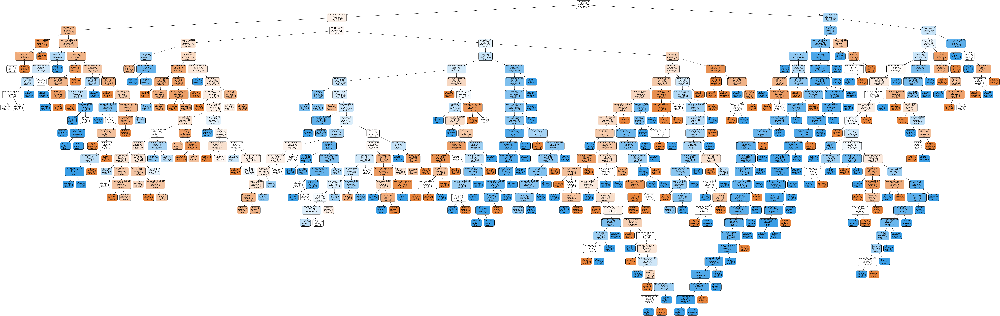

In [31]:
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('decTreeWiki.png')
Image(graph.create_png())

In [21]:
# doing same thing, but the other side of the training set is pre-1964 companies  


# note this has not been run ... there are only 270 pre_1964 companies, so cannot do 50/50 unless we make the other data set smaller 
m = 270
subset_listed_pre = subset_listed.sample(m, replace=False)
subset_nonlisted_pre = pre_1964[pre_1964['flag_mergent_plus_listing']==0]
sample = subset_nonlisted_pre.sample(m,replace=False)
pre_1964_data = pd.concat([subset_listed_pre, sample])

In [22]:
data_model_pre = pre_1964_data[["duns", "company_name0", 'flag_mergent', "flag_listing", "flag_mergent_plus_listing", "prob_nw_eth_wiki", "flag_owner",  'naics2', 'naics_name', 'prop_nwh', 'prob_ld']]
data_model_pre

,duns,company_name0,flag_mergent,flag_listing,flag_mergent_plus_listing,prob_nw_eth_wiki,flag_owner,naics2,naics_name,prop_nwh,prob_ld
18103,96-937-5166,jng technologies,1,0,1,0.032066,0,54,"Professional, Scientific, and Technical Services",62.252846,1
10922,12-247-6653,design construction group,1,0,1,0.952813,0,23,Construction,50.196263,1
9050,07-926-0195,majeskie cleaning services,1,0,1,0.923754,0,56,Administrative and Support and Waste Managemen...,57.881137,0
18033,96-868-4931,ajs digital solutions,1,0,1,0.074990,0,54,"Professional, Scientific, and Technical Services",51.439267,1
11610,14-647-1292,pink nails,0,1,1,0.529742,0,81,Other Services (except Public Administration),63.205627,1
...,...,...,...,...,...,...,...,...,...,...,...
8338,07-780-0613,farm credit administration,0,0,0,1.000000,0,92,Public Administration,38.949672,1
12184,17-063-7052,unity of fairfax,0,0,0,0.388064,0,81,Other Services (except Public Administration),21.600854,0
14509,80-264-0565,sydenstricker united methodist church,0,0,0,0.869655,0,81,Other Services (except Public Administration),22.277654,0
14036,78-949-9159,holmes run acres recreation association,0,0,0,1.000000,0,71,"Arts, Entertainment, and Recreation",45.175541,1


In [23]:
data_model_pre = data_model[pd.notna(data_model['prob_nw_eth_wiki'])]
data_model_pre = data_model[pd.notna(data_model['flag_owner'])]
#data_model_pre = data_model[pd.notna(data_model['naics2'])]
data_model_pre = data_model[pd.notna(data_model['prop_nwh'])]
data_model_pre = data_model[pd.notna(data_model['prob_ld'])]

In [25]:
feature_cols = ["prob_nw_eth_wiki", "flag_owner", "prop_nwh", 'prob_ld']
Y_pre = data_model['flag_mergent_plus_listing']
X_pre = data_model[feature_cols]

In [26]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_pre,Y_pre)

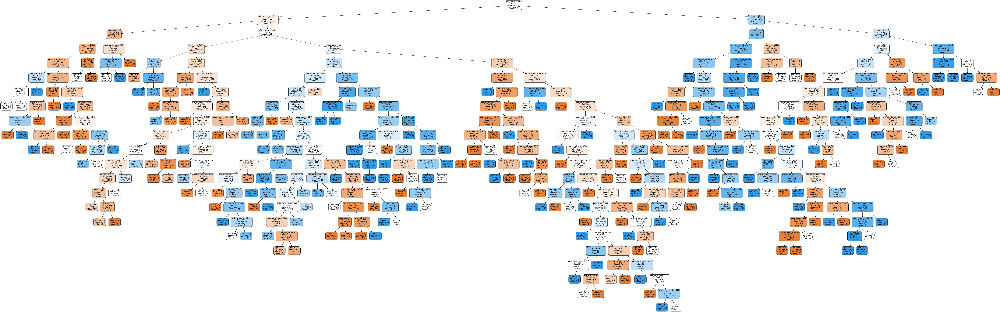

In [27]:
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('decTreeWiki_pre1964.png')
Image(graph.create_png())